# Data Preparation for Machine Learning

## Initial config

In [0]:
%run ./configs_data_prep_ml

In [0]:
%sql
select current_catalog() as actual_catalog,  current_schema() as actual_schema;


actual_catalog,actual_schema
studies,data_prep_ml


## Dataset

- https://archive.ics.uci.edu/dataset/1186/paddy+dataset

---

> Agriculture occupies a third of Earth's surface and is vital for food production. Rice, grown from paddy seeds, feeds nearly half the global population. To meet rising food demands, this study aims to enhance rice production using Machine Learning (ML) to predict factors affecting paddy growth. A Hybrid ML Model with Combined Wrapper Feature Selection (HMLCWFS) was developed to address challenges like overfitting and computational costs. Five Feature Selection (FS) methods—Backward Elimination, Stepwise Forward Selection, Feature Importance, Exhaustive FS, and Gradient Boosting—were applied. Selected features were merged using Poincaré's formula to form a refined dataset. ML models such as Decision Tree, Random Forest, SVM, KNN, and Naive Bayes were trained and tested. The model not only forecasts yield but also recommends paddy varieties based on farmers' preferences. Results show that combined FS techniques effectively identify key factors for improving paddy productivity.


In [0]:
data_path = r'/Volumes/studies/data_prep_ml/volume-datalake/paddydataset.csv'

df_paddy = spark.read.csv(
  data_path,
  header=True,
  inferSchema=True,
  multiLine=True,
  escape='"'
)

In [0]:
display(df_paddy.limit(5))

Hectares,Agriblock,Variety,Soil Types,Seedrate(in Kg),LP_Mainfield(in Tonnes),Nursery,Nursery area (Cents),LP_nurseryarea(in Tonnes),DAP_20days,Weed28D_thiobencarb,Urea_40Days,Potassh_50Days,Micronutrients_70Days,Pest_60Day(in ml),30DRain( in mm),30DAI(in mm),30_50DRain( in mm),30_50DAI(in mm),51_70DRain(in mm),51_70AI(in mm),71_105DRain(in mm),71_105DAI(in mm),Min temp_D1_D30,Max temp_D1_D30,Min temp_D31_D60,Max temp_D31_D60,Min temp_D61_D90,Max temp_D61_D90,Min temp_D91_D120,Max temp_D91_D120,Inst Wind Speed_D1_D30(in Knots),Inst Wind Speed_D31_D60(in Knots),Inst Wind Speed_D61_D90(in Knots),Inst Wind Speed_D91_D120(in Knots),Wind Direction_D1_D30,Wind Direction_D31_D60,Wind Direction_D61_D90,Wind Direction_D91_D120,Relative Humidity_D1_D30,Relative Humidity_D31_D60,Relative Humidity_D61_D90,Relative Humidity_D91_D120,Trash(in bundles),Paddy yield(in Kg)
6,Cuddalore,CO_43,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,18.5,34,16.0,30,15.5,31.0,16.0,33.0,4,10,8,10,SW,W,NNW,WSW,72.0,78,88,85,540,35028
6,Kurinjipadi,ponmani,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,19.5,34,18.5,35,17.0,32.5,16.0,30.5,10,4,10,6,NW,S,SE,SSE,64.6,85,84,87,600,35412
6,Panruti,delux ponni,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,20.0,35,18.0,30,17.5,33.5,18.0,33.0,4,12,4,12,ENE,NE,NNE,W,85.0,96,84,79,600,36300
6,Kallakurichi,CO_43,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,19.0,33,17.0,32,16.5,31.5,15.5,32.5,8,6,8,6,W,WNW,SE,S,88.5,95,81,84,540,35016
6,Sankarapuram,ponmani,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.1,21.9,185.6,272.4,166.1,250.9,60.2,64.8,20.5,32,17.5,28,18.0,34.0,16.5,35.0,10,12,10,12,SSE,W,SW,NW,72.7,91,83,81,600,34044


In [0]:
display(df_paddy.summary())

summary,Hectares,Agriblock,Variety,Soil Types,Seedrate(in Kg),LP_Mainfield(in Tonnes),Nursery,Nursery area (Cents),LP_nurseryarea(in Tonnes),DAP_20days,Weed28D_thiobencarb,Urea_40Days,Potassh_50Days,Micronutrients_70Days,Pest_60Day(in ml),30DRain( in mm),30DAI(in mm),30_50DRain( in mm),30_50DAI(in mm),51_70DRain(in mm),51_70AI(in mm),71_105DRain(in mm),71_105DAI(in mm),Min temp_D1_D30,Max temp_D1_D30,Min temp_D31_D60,Max temp_D31_D60,Min temp_D61_D90,Max temp_D61_D90,Min temp_D91_D120,Max temp_D91_D120,Inst Wind Speed_D1_D30(in Knots),Inst Wind Speed_D31_D60(in Knots),Inst Wind Speed_D61_D90(in Knots),Inst Wind Speed_D91_D120(in Knots),Wind Direction_D1_D30,Wind Direction_D31_D60,Wind Direction_D61_D90,Wind Direction_D91_D120,Relative Humidity_D1_D30,Relative Humidity_D31_D60,Relative Humidity_D61_D90,Relative Humidity_D91_D120,Trash(in bundles),Paddy yield(in Kg)
count,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789,2789
mean,3.7174614557188956,null,null,null,92.93653639297239,46.46826819648619,null,74.34922911437792,3.7174614557188956,148.69845822875584,7.434922911437791,100.85472929365442,38.587249910362424,55.76192183578343,2230.4768734313375,18.723592685549736,21.276407314450314,186.0167802079617,271.9832197920509,166.16167084976172,250.83832915023592,60.40839010398025,64.59160989601952,19.337217640731446,33.12943707422015,17.140372893510218,31.32162065256364,16.68304051631409,32.66116887773396,16.192183578343492,32.703657224811764,7.233416995338831,8.512728576550735,8.17282179992829,9.449264969523126,null,null,null,null,76.25693797060063,87.59411975618501,85.16027249910363,83.85944783076371,335.51093581929007,22517.728935102186
stddev,1.4377768122358012,null,null,null,35.94442030589504,17.97221015294752,null,28.755536244715902,1.4377768122358012,57.511072489431804,2.8755536244716025,39.00688491595675,14.924123311007563,21.566652183536462,862.6660873414805,0.6437893338238353,0.6437893338238301,0.8566087682687861,0.8566087682687922,0.67860113676007,0.6786011367600882,0.42830438413440786,0.42830438413439575,0.8705892743892033,1.3167981601681256,1.0351245276438015,2.5345890038533563,1.0691325504731441,1.0783184391404639,0.9006393397095215,1.4958482351900777,2.5665493540574595,3.2036787350516045,1.9935962663805824,2.5166640453608577,null,null,null,null,8.001361484090728,6.776736293629912,3.492529339643624,3.1348748456010505,134.31477210071995,9199.661392680953
min,1,Chinnasalem,CO_43,alluvial,25,12.5,dry,20,1,40,2,27.13,10.38,15,600,18.1,20.4,185.2,270.8,165.3,250.0,60.0,64.0,18.0,31,15.5,28,15.0,31.0,15.0,30.5,4,4,4,6,E,ENE,NE,NNW,64.6,78,81,79,80,5410
25%,3,null,null,null,75,37.5,null,60,3,120,6,81.39,31.14,45,1800,18.1,20.4,185.2,270.8,165.3,250.0,60.0,64.0,18.5,32,16.0,30,15.5,31.5,15.5,31.5,4,6,8,6,null,null,null,null,72.0,80,83,81,240,16389
50%,4,null,null,null,100,50.0,null,80,4,160,8,108.52,41.52,60,2400,18.5,21.5,185.6,272.4,166.1,250.9,60.2,64.8,19.5,33,17.5,30,17.0,33.0,16.0,33.0,8,10,8,10,null,null,null,null,72.7,91,84,84,360,24636
75%,5,null,null,null,125,62.5,null,100,5,200,10,135.65,51.9,75,3000,19.6,21.9,187.2,272.8,167.0,251.7,61.0,65.0,20.0,34,18.0,34,17.5,33.5,16.5,33.0,10,12,10,12,null,null,null,null,85.0,95,88,87,450,31035
max,6,Sankarapuram,ponmani,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,19.6,21.9,187.2,272.8,167.0,251.7,61.0,65.0,20.5,35,18.5,35,18.0,34.0,18.0,35.0,10,12,10,12,W,WNW,SW,WSW,88.5,96,92,88,600,38814


In [0]:
print(df_paddy.columns)

['Hectares ', 'Agriblock', 'Variety', 'Soil Types', 'Seedrate(in Kg)', 'LP_Mainfield(in Tonnes)', 'Nursery', 'Nursery area (Cents)', 'LP_nurseryarea(in Tonnes)', 'DAP_20days', 'Weed28D_thiobencarb', 'Urea_40Days', 'Potassh_50Days', 'Micronutrients_70Days', 'Pest_60Day(in ml)', '30DRain( in mm)', '30DAI(in mm)', '30_50DRain( in mm)', '30_50DAI(in mm)', '51_70DRain(in mm)', '51_70AI(in mm)', '71_105DRain(in mm)', '71_105DAI(in mm)', 'Min temp_D1_D30', 'Max temp_D1_D30', 'Min temp_D31_D60', 'Max temp_D31_D60', 'Min temp_D61_D90', 'Max temp_D61_D90', 'Min temp_D91_D120', 'Max temp_D91_D120', 'Inst Wind Speed_D1_D30(in Knots)', 'Inst Wind Speed_D31_D60(in Knots)', 'Inst Wind Speed_D61_D90(in Knots)', 'Inst Wind Speed_D91_D120(in Knots)', 'Wind Direction_D1_D30', 'Wind Direction_D31_D60', 'Wind Direction_D61_D90', 'Wind Direction_D91_D120', 'Relative Humidity_D1_D30', 'Relative Humidity_D31_D60', 'Relative Humidity_D61_D90', 'Relative Humidity_D91_D120', 'Trash(in bundles)', 'Paddy yield(in 

In [0]:
display(df_paddy)

Hectares,Agriblock,Variety,Soil Types,Seedrate(in Kg),LP_Mainfield(in Tonnes),Nursery,Nursery area (Cents),LP_nurseryarea(in Tonnes),DAP_20days,Weed28D_thiobencarb,Urea_40Days,Potassh_50Days,Micronutrients_70Days,Pest_60Day(in ml),30DRain( in mm),30DAI(in mm),30_50DRain( in mm),30_50DAI(in mm),51_70DRain(in mm),51_70AI(in mm),71_105DRain(in mm),71_105DAI(in mm),Min temp_D1_D30,Max temp_D1_D30,Min temp_D31_D60,Max temp_D31_D60,Min temp_D61_D90,Max temp_D61_D90,Min temp_D91_D120,Max temp_D91_D120,Inst Wind Speed_D1_D30(in Knots),Inst Wind Speed_D31_D60(in Knots),Inst Wind Speed_D61_D90(in Knots),Inst Wind Speed_D91_D120(in Knots),Wind Direction_D1_D30,Wind Direction_D31_D60,Wind Direction_D61_D90,Wind Direction_D91_D120,Relative Humidity_D1_D30,Relative Humidity_D31_D60,Relative Humidity_D61_D90,Relative Humidity_D91_D120,Trash(in bundles),Paddy yield(in Kg)
6,Cuddalore,CO_43,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,18.5,34,16.0,30,15.5,31.0,16.0,33.0,4,10,8,10,SW,W,NNW,WSW,72.0,78,88,85,540,35028
6,Kurinjipadi,ponmani,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,19.5,34,18.5,35,17.0,32.5,16.0,30.5,10,4,10,6,NW,S,SE,SSE,64.6,85,84,87,600,35412
6,Panruti,delux ponni,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,20.0,35,18.0,30,17.5,33.5,18.0,33.0,4,12,4,12,ENE,NE,NNE,W,85.0,96,84,79,600,36300
6,Kallakurichi,CO_43,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,19.0,33,17.0,32,16.5,31.5,15.5,32.5,8,6,8,6,W,WNW,SE,S,88.5,95,81,84,540,35016
6,Sankarapuram,ponmani,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.1,21.9,185.6,272.4,166.1,250.9,60.2,64.8,20.5,32,17.5,28,18.0,34.0,16.5,35.0,10,12,10,12,SSE,W,SW,NW,72.7,91,83,81,600,34044
6,Chinnasalem,delux ponni,alluvial,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,18.1,21.9,185.6,272.4,166.1,250.9,60.2,64.8,18.0,31,15.5,34,15.0,33.0,15.0,31.5,6,6,8,10,E,ENE,NE,NNW,78.6,80,92,88,480,36732
6,Cuddalore,CO_43,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,18.5,34,16.0,30,15.5,31.0,16.0,33.0,4,10,8,10,SW,W,NNW,WSW,72.0,78,88,85,540,33162
6,Kurinjipadi,delux ponni,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,19.5,34,18.5,35,17.0,32.5,16.0,30.5,10,4,10,6,NW,S,SE,SSE,64.6,85,84,87,480,36690
6,Panruti,ponmani,clay,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,20.0,35,18.0,30,17.5,33.5,18.0,33.0,4,12,4,12,ENE,NE,NNE,W,85.0,96,84,79,600,35310
6,Kallakurichi,CO_43,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,19.0,33,17.0,32,16.5,31.5,15.5,32.5,8,6,8,6,W,WNW,SE,S,88.5,95,81,84,540,32460


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

In [0]:
display(df_paddy.groupBy(['Variety', 'Soil Types']).count().orderBy('count', ascending=False))

Variety,Soil Types,count
ponmani,clay,574
delux ponni,clay,549
ponmani,alluvial,487
delux ponni,alluvial,447
CO_43,clay,398
CO_43,alluvial,334


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

In [0]:
display(df_paddy.groupBy('Variety').avg('Paddy yield(in Kg)'))

Variety,avg(Paddy yield(in Kg))
delux ponni,22614.449799196787
CO_43,22540.66393442623
ponmani,22411.11027332705


In [0]:
df_paddy_pd = df_paddy.toPandas()
df_paddy_pd.head()

,Hectares,Agriblock,Variety,Soil Types,Seedrate(in Kg),LP_Mainfield(in Tonnes),Nursery,Nursery area (Cents),LP_nurseryarea(in Tonnes),DAP_20days,Weed28D_thiobencarb,Urea_40Days,Potassh_50Days,Micronutrients_70Days,Pest_60Day(in ml),30DRain( in mm),30DAI(in mm),30_50DRain( in mm),30_50DAI(in mm),51_70DRain(in mm),51_70AI(in mm),71_105DRain(in mm),71_105DAI(in mm),Min temp_D1_D30,Max temp_D1_D30,Min temp_D31_D60,Max temp_D31_D60,Min temp_D61_D90,Max temp_D61_D90,Min temp_D91_D120,Max temp_D91_D120,Inst Wind Speed_D1_D30(in Knots),Inst Wind Speed_D31_D60(in Knots),Inst Wind Speed_D61_D90(in Knots),Inst Wind Speed_D91_D120(in Knots),Wind Direction_D1_D30,Wind Direction_D31_D60,Wind Direction_D61_D90,Wind Direction_D91_D120,Relative Humidity_D1_D30,Relative Humidity_D31_D60,Relative Humidity_D61_D90,Relative Humidity_D91_D120,Trash(in bundles),Paddy yield(in Kg)
0,6,Cuddalore,CO_43,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,18.5,34,16.0,30,15.5,31.0,16.0,33.0,4,10,8,10,SW,W,NNW,WSW,72.0,78,88,85,540,35028
1,6,Kurinjipadi,ponmani,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,19.5,34,18.5,35,17.0,32.5,16.0,30.5,10,4,10,6,NW,S,SE,SSE,64.6,85,84,87,600,35412
2,6,Panruti,delux ponni,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,20.0,35,18.0,30,17.5,33.5,18.0,33.0,4,12,4,12,ENE,NE,NNE,W,85.0,96,84,79,600,36300
3,6,Kallakurichi,CO_43,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,19.0,33,17.0,32,16.5,31.5,15.5,32.5,8,6,8,6,W,WNW,SE,S,88.5,95,81,84,540,35016
4,6,Sankarapuram,ponmani,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.1,21.9,185.6,272.4,166.1,250.9,60.2,64.8,20.5,32,17.5,28,18.0,34.0,16.5,35.0,10,12,10,12,SSE,W,SW,NW,72.7,91,83,81,600,34044


<Figure size 1000x1000 with 0 Axes>

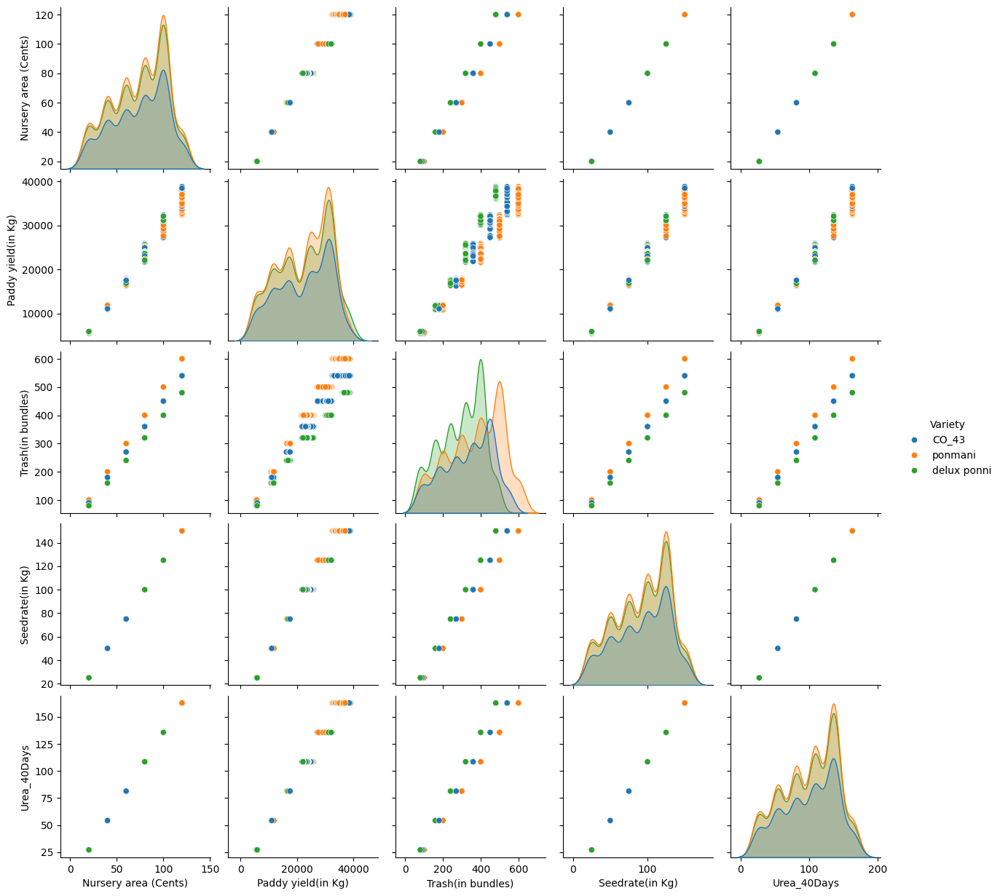

In [0]:
cols = [
    'Nursery area (Cents)', 'Paddy yield(in Kg)', 'Trash(in bundles)','Seedrate(in Kg)', 'Variety',
    'Urea_40Days',
]

plt.figure(figsize=(10, 10))
sns.pairplot(df_paddy_pd[cols], hue='Variety', diag_kind='kde')
plt.show();

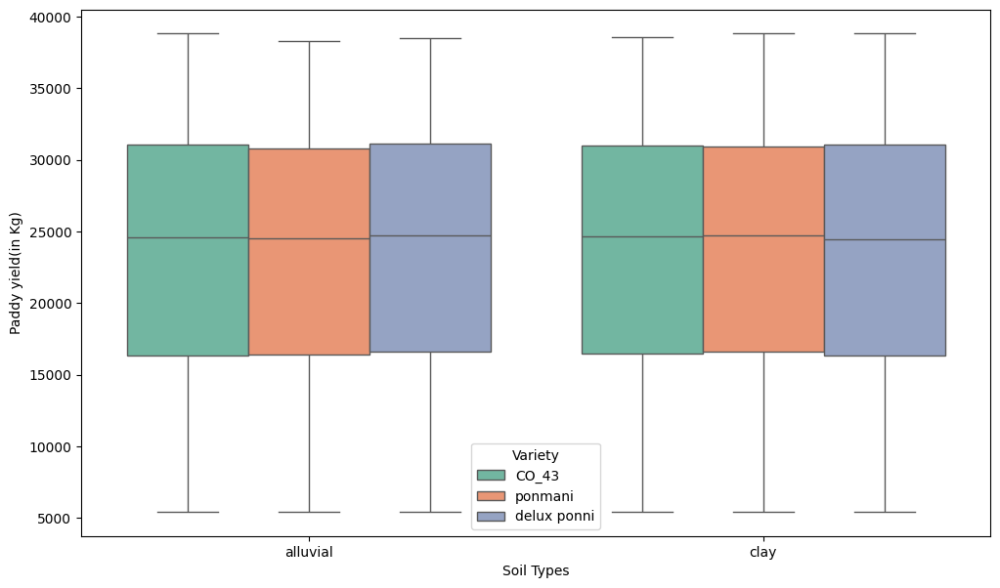

In [0]:
plt.figure(figsize=(12, 7))
sns.boxplot(data=df_paddy_pd, x='Soil Types', y='Paddy yield(in Kg)', hue='Variety', palette='Set2')
plt.show();

In [0]:
def clean_columns(df):
    new_cols = [
        re.sub(r'[^a-zA-Z0-9_]', '_', col).lower()
        for col in df.columns
    ]
    return df.toDF(*new_cols)

df_paddy = clean_columns(df_paddy)

In [0]:
table_name = 'paddy_dataset'

df_paddy.write.mode('overwrite').saveAsTable(table_name)

In [0]:
display(spark.sql(f'SELECT * FROM {table_name}'))

hectares_,agriblock,variety,soil_types,seedrate_in_kg_,lp_mainfield_in_tonnes_,nursery,nursery_area__cents_,lp_nurseryarea_in_tonnes_,dap_20days,weed28d_thiobencarb,urea_40days,potassh_50days,micronutrients_70days,pest_60day_in_ml_,30drain__in_mm_,30dai_in_mm_,30_50drain__in_mm_,30_50dai_in_mm_,51_70drain_in_mm_,51_70ai_in_mm_,71_105drain_in_mm_,71_105dai_in_mm_,min_temp_d1_d30,max_temp_d1_d30,min_temp_d31_d60,max_temp_d31_d60,min_temp_d61_d90,max_temp_d61_d90,min_temp_d91_d120,max_temp_d91_d120,inst_wind_speed_d1_d30_in_knots_,inst_wind_speed_d31_d60_in_knots_,inst_wind_speed_d61_d90_in_knots_,inst_wind_speed_d91_d120_in_knots_,wind_direction_d1_d30,wind_direction_d31_d60,wind_direction_d61_d90,wind_direction_d91_d120,relative_humidity_d1_d30,relative_humidity_d31_d60,relative_humidity_d61_d90,relative_humidity_d91_d120,trash_in_bundles_,paddy_yield_in_kg_
6,Cuddalore,CO_43,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,18.5,34,16.0,30,15.5,31.0,16.0,33.0,4,10,8,10,SW,W,NNW,WSW,72.0,78,88,85,540,35028
6,Kurinjipadi,ponmani,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,19.5,34,18.5,35,17.0,32.5,16.0,30.5,10,4,10,6,NW,S,SE,SSE,64.6,85,84,87,600,35412
6,Panruti,delux ponni,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,20.0,35,18.0,30,17.5,33.5,18.0,33.0,4,12,4,12,ENE,NE,NNE,W,85.0,96,84,79,600,36300
6,Kallakurichi,CO_43,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,19.0,33,17.0,32,16.5,31.5,15.5,32.5,8,6,8,6,W,WNW,SE,S,88.5,95,81,84,540,35016
6,Sankarapuram,ponmani,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.1,21.9,185.6,272.4,166.1,250.9,60.2,64.8,20.5,32,17.5,28,18.0,34.0,16.5,35.0,10,12,10,12,SSE,W,SW,NW,72.7,91,83,81,600,34044
6,Chinnasalem,delux ponni,alluvial,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,18.1,21.9,185.6,272.4,166.1,250.9,60.2,64.8,18.0,31,15.5,34,15.0,33.0,15.0,31.5,6,6,8,10,E,ENE,NE,NNW,78.6,80,92,88,480,36732
6,Cuddalore,CO_43,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,18.5,34,16.0,30,15.5,31.0,16.0,33.0,4,10,8,10,SW,W,NNW,WSW,72.0,78,88,85,540,33162
6,Kurinjipadi,delux ponni,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,19.5,34,18.5,35,17.0,32.5,16.0,30.5,10,4,10,6,NW,S,SE,SSE,64.6,85,84,87,480,36690
6,Panruti,ponmani,clay,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,20.0,35,18.0,30,17.5,33.5,18.0,33.0,4,12,4,12,ENE,NE,NNE,W,85.0,96,84,79,600,35310
6,Kallakurichi,CO_43,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,19.0,33,17.0,32,16.5,31.5,15.5,32.5,8,6,8,6,W,WNW,SE,S,88.5,95,81,84,540,32460


## Time-travel with Delta table

In [0]:
cols_to_drop = ['seedrate_in_kg_', 'lp_mainfield_in_tonnes_', 'lp_nurseryarea_in_tonnes_', 'dap_20days', 'weed28d_thiobencarb', 'urea_40days']
df_paddy_dropped = df_paddy.drop(*cols_to_drop)

df_paddy_dropped.write.mode('overwrite').option('overwriteSchema', 'true').saveAsTable(table_name)

### Revert changes by version

In [0]:
table_name

'paddy_dataset'

In [ ]:
%sql

DESCRIBE HISTORY paddy_dataset

In [ ]:
spark.table(table_name).printSchema()

In [0]:
df_paddy_dropped_v0 = (
	spark.read
		.option('VersionAsOf', 0)
		.table(table_name)
)

df_paddy_dropped_v0.printSchema()

root
 |-- hectares_: integer (nullable = true)
 |-- agriblock: string (nullable = true)
 |-- variety: string (nullable = true)
 |-- soil_types: string (nullable = true)
 |-- seedrate_in_kg_: integer (nullable = true)
 |-- lp_mainfield_in_tonnes_: double (nullable = true)
 |-- nursery: string (nullable = true)
 |-- nursery_area__cents_: integer (nullable = true)
 |-- lp_nurseryarea_in_tonnes_: integer (nullable = true)
 |-- dap_20days: integer (nullable = true)
 |-- weed28d_thiobencarb: integer (nullable = true)
 |-- urea_40days: double (nullable = true)
 |-- potassh_50days: double (nullable = true)
 |-- micronutrients_70days: integer (nullable = true)
 |-- pest_60day_in_ml_: integer (nullable = true)
 |-- 30drain__in_mm_: double (nullable = true)
 |-- 30dai_in_mm_: double (nullable = true)
 |-- 30_50drain__in_mm_: double (nullable = true)
 |-- 30_50dai_in_mm_: double (nullable = true)
 |-- 51_70drain_in_mm_: double (nullable = true)
 |-- 51_70ai_in_mm_: double (nullable = true)
 |-- 71

In [0]:
table_name

'paddy_dataset'

In [0]:
ts_v0 = spark.sql(
	f'DESCRIBE HISTORY paddy_dataset'
).orderBy('version').first().timestamp

print(ts_v0)

2026-04-25 21:27:44


In [0]:
(spark.read
	.option('timestampAsOf', ts_v0)
	.table(table_name)
	.printSchema()
)

root
 |-- hectares_: integer (nullable = true)
 |-- agriblock: string (nullable = true)
 |-- variety: string (nullable = true)
 |-- soil_types: string (nullable = true)
 |-- seedrate_in_kg_: integer (nullable = true)
 |-- lp_mainfield_in_tonnes_: double (nullable = true)
 |-- nursery: string (nullable = true)
 |-- nursery_area__cents_: integer (nullable = true)
 |-- lp_nurseryarea_in_tonnes_: integer (nullable = true)
 |-- dap_20days: integer (nullable = true)
 |-- weed28d_thiobencarb: integer (nullable = true)
 |-- urea_40days: double (nullable = true)
 |-- potassh_50days: double (nullable = true)
 |-- micronutrients_70days: integer (nullable = true)
 |-- pest_60day_in_ml_: integer (nullable = true)
 |-- 30drain__in_mm_: double (nullable = true)
 |-- 30dai_in_mm_: double (nullable = true)
 |-- 30_50drain__in_mm_: double (nullable = true)
 |-- 30_50dai_in_mm_: double (nullable = true)
 |-- 51_70drain_in_mm_: double (nullable = true)
 |-- 51_70ai_in_mm_: double (nullable = true)
 |-- 71

In [0]:
cols_to_drop = ['']
df_paddy_dropped = df_paddy.drop(*cols_to_drop)

df_paddy_dropped.write.mode('overwrite').option('overwriteSchema', 'true').saveAsTable(table_name)

## Data cleaning and imputation

In [0]:
display(df_paddy)

hectares_,agriblock,variety,soil_types,seedrate_in_kg_,lp_mainfield_in_tonnes_,nursery,nursery_area__cents_,lp_nurseryarea_in_tonnes_,dap_20days,weed28d_thiobencarb,urea_40days,potassh_50days,micronutrients_70days,pest_60day_in_ml_,30drain__in_mm_,30dai_in_mm_,30_50drain__in_mm_,30_50dai_in_mm_,51_70drain_in_mm_,51_70ai_in_mm_,71_105drain_in_mm_,71_105dai_in_mm_,min_temp_d1_d30,max_temp_d1_d30,min_temp_d31_d60,max_temp_d31_d60,min_temp_d61_d90,max_temp_d61_d90,min_temp_d91_d120,max_temp_d91_d120,inst_wind_speed_d1_d30_in_knots_,inst_wind_speed_d31_d60_in_knots_,inst_wind_speed_d61_d90_in_knots_,inst_wind_speed_d91_d120_in_knots_,wind_direction_d1_d30,wind_direction_d31_d60,wind_direction_d61_d90,wind_direction_d91_d120,relative_humidity_d1_d30,relative_humidity_d31_d60,relative_humidity_d61_d90,relative_humidity_d91_d120,trash_in_bundles_,paddy_yield_in_kg_
6,Cuddalore,CO_43,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,18.5,34,16.0,30,15.5,31.0,16.0,33.0,4,10,8,10,SW,W,NNW,WSW,72.0,78,88,85,540,35028
6,Kurinjipadi,ponmani,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,19.5,34,18.5,35,17.0,32.5,16.0,30.5,10,4,10,6,NW,S,SE,SSE,64.6,85,84,87,600,35412
6,Panruti,delux ponni,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,20.0,35,18.0,30,17.5,33.5,18.0,33.0,4,12,4,12,ENE,NE,NNE,W,85.0,96,84,79,600,36300
6,Kallakurichi,CO_43,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,19.0,33,17.0,32,16.5,31.5,15.5,32.5,8,6,8,6,W,WNW,SE,S,88.5,95,81,84,540,35016
6,Sankarapuram,ponmani,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.1,21.9,185.6,272.4,166.1,250.9,60.2,64.8,20.5,32,17.5,28,18.0,34.0,16.5,35.0,10,12,10,12,SSE,W,SW,NW,72.7,91,83,81,600,34044
6,Chinnasalem,delux ponni,alluvial,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,18.1,21.9,185.6,272.4,166.1,250.9,60.2,64.8,18.0,31,15.5,34,15.0,33.0,15.0,31.5,6,6,8,10,E,ENE,NE,NNW,78.6,80,92,88,480,36732
6,Cuddalore,CO_43,clay,150,75.0,wet,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,18.5,34,16.0,30,15.5,31.0,16.0,33.0,4,10,8,10,SW,W,NNW,WSW,72.0,78,88,85,540,33162
6,Kurinjipadi,delux ponni,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,19.6,20.4,187.2,270.8,167.0,250.0,61.0,64.0,19.5,34,18.5,35,17.0,32.5,16.0,30.5,10,4,10,6,NW,S,SE,SSE,64.6,85,84,87,480,36690
6,Panruti,ponmani,clay,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,20.0,35,18.0,30,17.5,33.5,18.0,33.0,4,12,4,12,ENE,NE,NNE,W,85.0,96,84,79,600,35310
6,Kallakurichi,CO_43,alluvial,150,75.0,dry,120,6,240,12,162.78,62.28,90,3600,18.5,21.5,185.2,272.8,165.3,251.7,60.0,65.0,19.0,33,17.0,32,16.5,31.5,15.5,32.5,8,6,8,6,W,WNW,SE,S,88.5,95,81,84,540,32460


In [0]:
df_paddy.printSchema()

root
 |-- hectares_: integer (nullable = true)
 |-- agriblock: string (nullable = true)
 |-- variety: string (nullable = true)
 |-- soil_types: string (nullable = true)
 |-- seedrate_in_kg_: integer (nullable = true)
 |-- lp_mainfield_in_tonnes_: double (nullable = true)
 |-- nursery: string (nullable = true)
 |-- nursery_area__cents_: integer (nullable = true)
 |-- lp_nurseryarea_in_tonnes_: integer (nullable = true)
 |-- dap_20days: integer (nullable = true)
 |-- weed28d_thiobencarb: integer (nullable = true)
 |-- urea_40days: double (nullable = true)
 |-- potassh_50days: double (nullable = true)
 |-- micronutrients_70days: integer (nullable = true)
 |-- pest_60day_in_ml_: integer (nullable = true)
 |-- 30drain__in_mm_: double (nullable = true)
 |-- 30dai_in_mm_: double (nullable = true)
 |-- 30_50drain__in_mm_: double (nullable = true)
 |-- 30_50dai_in_mm_: double (nullable = true)
 |-- 51_70drain_in_mm_: double (nullable = true)
 |-- 51_70ai_in_mm_: double (nullable = true)
 |-- 71

In [0]:
# df_paddy.toPandas().isna().sum()

In [0]:
null_counts = df_paddy.select([
    sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
    for c in df_paddy.columns
])

null_counts = null_counts.toPandas().T.reset_index()
null_counts.columns = ['column', 'null_count']

null_counts

,column,null_count
0,hectares_,0
1,agriblock,0
2,variety,0
3,soil_types,0
4,seedrate_in_kg_,0
5,lp_mainfield_in_tonnes_,0
6,nursery,0
7,nursery_area__cents_,0
8,lp_nurseryarea_in_tonnes_,0
9,dap_20days,0
